### EDA

In [18]:
%cd /opt/ml/detection/

/opt/ml/detection


In [19]:
# !pip install seaborn

import libary

In [20]:
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

from pycocotools.coco import COCO
import cv2
import os

dataset setting

In [21]:
train = '/opt/ml/detection/dataset/train.json'
coco = COCO(train)

base_path = '/opt/ml/detection/dataset'
img_path = os.path.join(base_path, coco.loadImgs(1)[0]['file_name'])
image = cv2.imread(img_path)

loading annotations into memory...
Done (t=0.08s)
creating index...
index created!


json load

In [22]:
import json

with open('dataset/train.json') as json_file:
    train_json = json.load(json_file)
    
print(len(train_json['annotations']))

23144


class count plot

/opt/conda/envs/detection/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


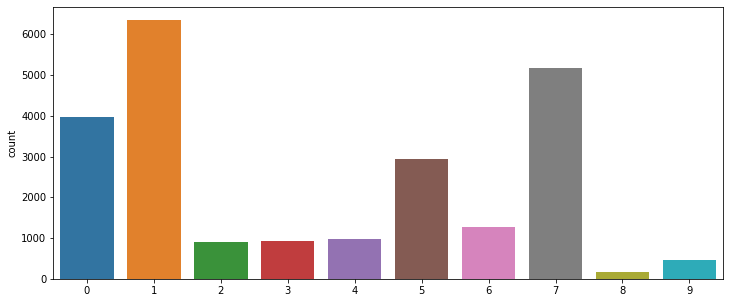

In [23]:
lst = []
for i in range(len(train_json['annotations'])):
    lst.append(coco.loadAnns(i)[0]['category_id'])

fig, axes = plt.subplots(1,1, figsize=(12,5))
sns.countplot(lst)
plt.show()

class count value

In [24]:
[lst.count(i) for i in range(10)]

[3966, 6352, 897, 936, 982, 2943, 1263, 5178, 159, 468]

class percentage

In [25]:
[round(lst.count(i)/len(lst)*100,2)  for i in range(10)]

[17.14, 27.45, 3.88, 4.04, 4.24, 12.72, 5.46, 22.37, 0.69, 2.02]

total count

In [26]:
len(lst)

23144

배터리만 시각화

In [27]:
classes = ("General trash", "Paper", "Paper pack", "Metal", "Glass", 
           "Plastic", "Styrofoam", "Plastic bag", "Battery", "Clothing")

root = '/opt/ml/detection/dataset'
json_file = root + 'train.json'

In [28]:
def load_image_id(coco):
    total_image_ids = coco.getImgIds()
    image_ids = []
    for i in total_image_ids:
        anno_ids = coco.getAnnIds(imgIds=i)
        if len(anno_ids) != 0:
            image_ids.append(i)
    return image_ids


def load_image(coco, img_idx, image_ids):
    global root 
    image_info = coco.loadImgs(image_ids[img_idx])[0]
    img = cv2.imread(os.path.join(root, image_info['file_name']))
    return img, image_info['width'], image_info['height']

def load_annotations(coco, img_idx, image_ids):
    global classes
    anno_ids = coco.getAnnIds(imgIds=image_ids[img_idx])
    bboxes, labels = [], []
    if len(anno_ids) == 0:
        return bboxes, labels
    loaded_anno = coco.loadAnns(anno_ids)
    for i, anno in enumerate(loaded_anno):
        if anno['bbox'][2] <= 0 or anno['bbox'][3] <= 0: # w,h 최소 길이 지정해 보았음
            continue
        bbox = anno['bbox']
        bboxes.append([bbox[0],bbox[1], bbox[0] +bbox[2], bbox[1] + bbox[3]])
        labels.append(anno['category_id'])
        #labels.append(classes[anno['category_id']])
    return bboxes, labels


In [29]:
image_ids = load_image_id(coco)

{0: 'General trash', 1: 'Paper', 2: 'Paper pack', 3: 'Metal', 4: 'Glass', 5: 'Plastic', 6: 'Styrofoam', 7: 'Plastic bag', 8: 'Battery', 9: 'Clothing'}


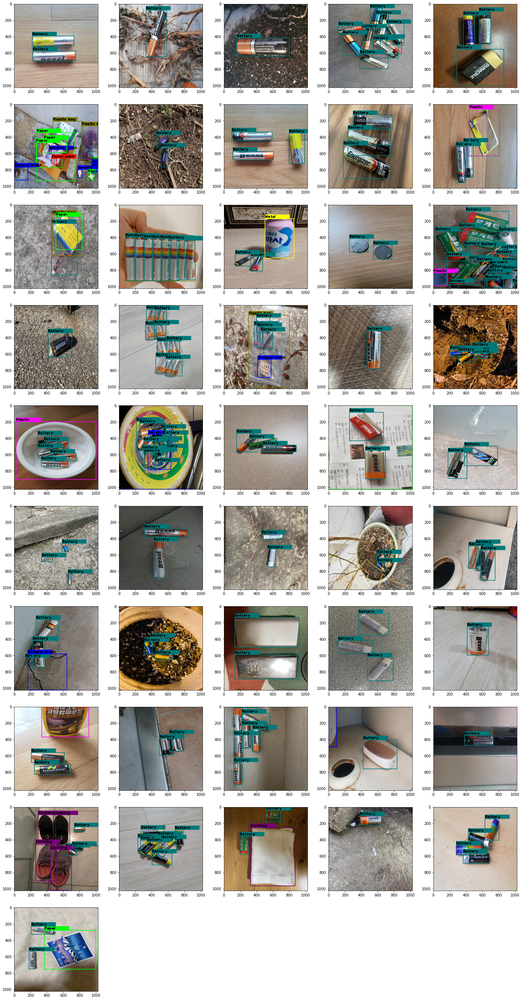

In [30]:
bettery_idx = []
for j in range(4883):
    bboxes, labels = load_annotations(coco, j, image_ids)
    if 8 in labels:
        bettery_idx.append(j)

mage_ids = load_image_id(coco)
dict_c = {i:v for i,v in enumerate(classes)}
print(dict_c)
color_list = [(0,0,255),(0,255,0),(255,0,0),(255,255,0),(0,255,255),(255,0,255),(255,255,255),(120,120,0),(0,120,120),(120,0,120)]

w_num, h_num = 5, 10
plt.figure(figsize=(w_num*5,h_num*5))
for j,b in enumerate(bettery_idx):
    img = load_image(coco, b, image_ids)[0]
    #img = cv2.resize(img, (512,512), interpolation = cv2.INTER_CUBIC)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    bboxes, labels = load_annotations(coco, b, image_ids)
    for i in range(len(bboxes)):
        bbox = list(map(int,bboxes[i]))
        label = labels[i]
        cv2.rectangle(img, (bbox[0],bbox[1]- 50),(bbox[0]+300,bbox[1]), color_list[label], -1)
        cv2.rectangle(img, (bbox[0],bbox[1]),(bbox[2],bbox[3]), color_list[label],5)
        cv2.putText(img, dict_c[label], (bbox[0],bbox[1]-10), cv2.FONT_HERSHEY_PLAIN, 3, (0,0,0), 5, cv2.LINE_AA)
    plt.subplot(h_num, w_num, j+1)
    plt.imshow(img)
plt.show()

작은 객체 시각화

{0: 'General trash', 1: 'Paper', 2: 'Paper pack', 3: 'Metal', 4: 'Glass', 5: 'Plastic', 6: 'Styrofoam', 7: 'Plastic bag', 8: 'Battery', 9: 'Clothing'}
[298, 602, 850, 912, 1020, 1056, 1063, 1071, 1135, 1222, 1377, 1426, 1521, 1963, 2413, 2556, 2630, 2639, 2902, 2956, 3148, 3697, 3712, 3756, 3991, 4195, 4313, 4456]


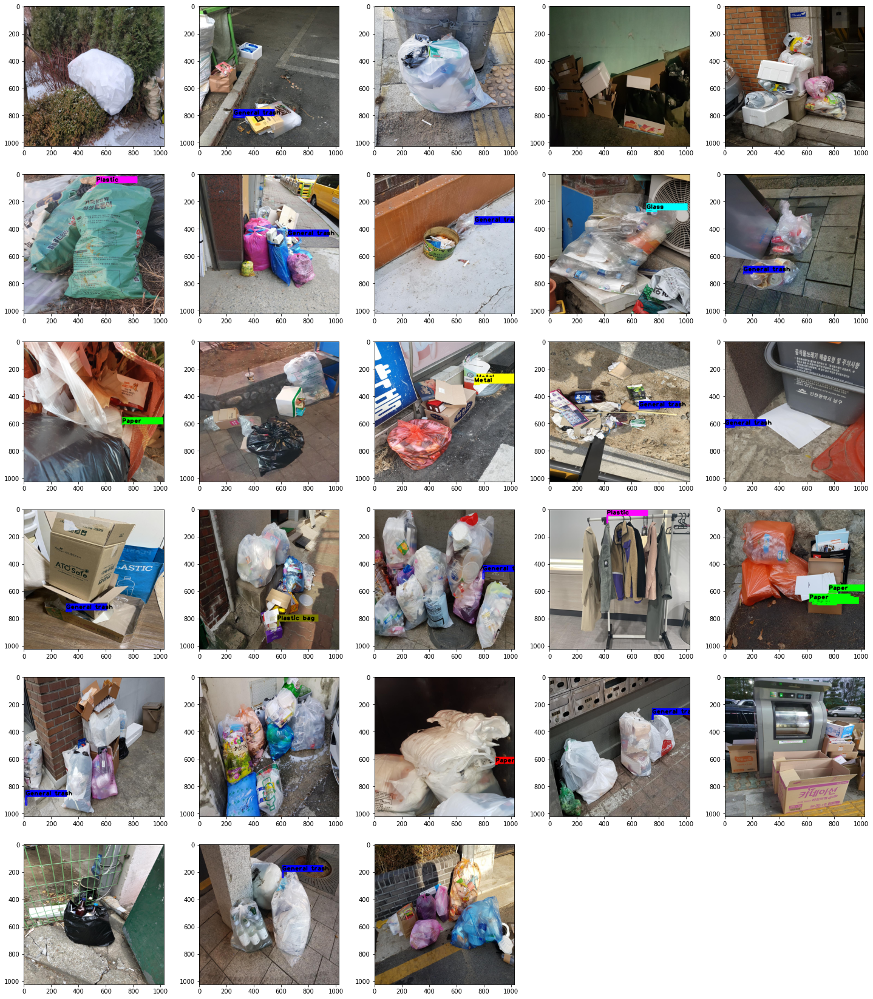

In [31]:
image_ids = load_image_id(coco)
dict_c = {i:v for i,v in enumerate(classes)}
print(dict_c)
color_list = [(0,0,255),(0,255,0),(255,0,0),(255,255,0),(0,255,255),(255,0,255),(255,255,255),(120,120,0),(0,120,120),(120,0,120)]
small_bbox = []
w_thres, h_thres =  10., 10.
for j in range(4883):
    bboxes, labels = load_annotations(coco, j, image_ids)
    for bbox in bboxes:
        width , height = bbox[2]-bbox[0], bbox[3]-bbox[1]
        if width < w_thres or height < h_thres:
            if j not in small_bbox:
                small_bbox.append(j)
print(small_bbox)

w_num, h_num = 5, 10
plt.figure(figsize=(w_num*5,h_num*5))
for j,b in enumerate(small_bbox):
    img = load_image(coco, b, image_ids)[0]
    #img = cv2.resize(img, (512,512), interpolation = cv2.INTER_CUBIC)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    bboxes, labels = load_annotations(coco, b, image_ids)
    for i in range(len(bboxes)):
        bbox = list(map(int,bboxes[i]))
        label = labels[i]
        width , height = bbox[2]-bbox[0], bbox[3]-bbox[1]
        if width < w_thres or height < h_thres:
            cv2.rectangle(img, (bbox[0],bbox[1]- 50),(bbox[0]+300,bbox[1]), color_list[label], -1)
            cv2.rectangle(img, (bbox[0],bbox[1]),(bbox[2],bbox[3]), color_list[label],5)
            cv2.putText(img, dict_c[label], (bbox[0],bbox[1]-10), cv2.FONT_HERSHEY_PLAIN, 3, (0,0,0), 5, cv2.LINE_AA)
    plt.subplot(h_num, w_num, j+1)
    plt.imshow(img)
plt.show()